$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 6: YOLO - Objects Detection
<a id=part6></a>

In this part we will use an object detection architecture called YOLO (You only look once) to detect objects in images. We'll use an already trained model weights (v5) found here: https://github.com/ultralytics/yolov5

In [1]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the YOLO model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
model.to(device)
# Images
img1 = 'imgs/DolphinsInTheSky.jpg'  
img2 = 'imgs/cat-shiba-inu-2.jpg' 

Using cache found in /Users/babi/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-7-3 Python-3.8.12 torch-2.0.1 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


## Inference with YOLO
<a id=part6_1></a>

You are provided with 2 images (img1 and img2).
**TODO**:
1. Detect objects using the YOLOv5 model for these 2 images.
2. Print the inference output with bounding boxes.
3. Look at the inference results and answer the question below.


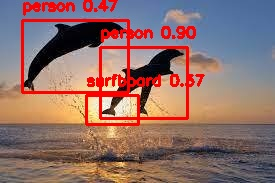

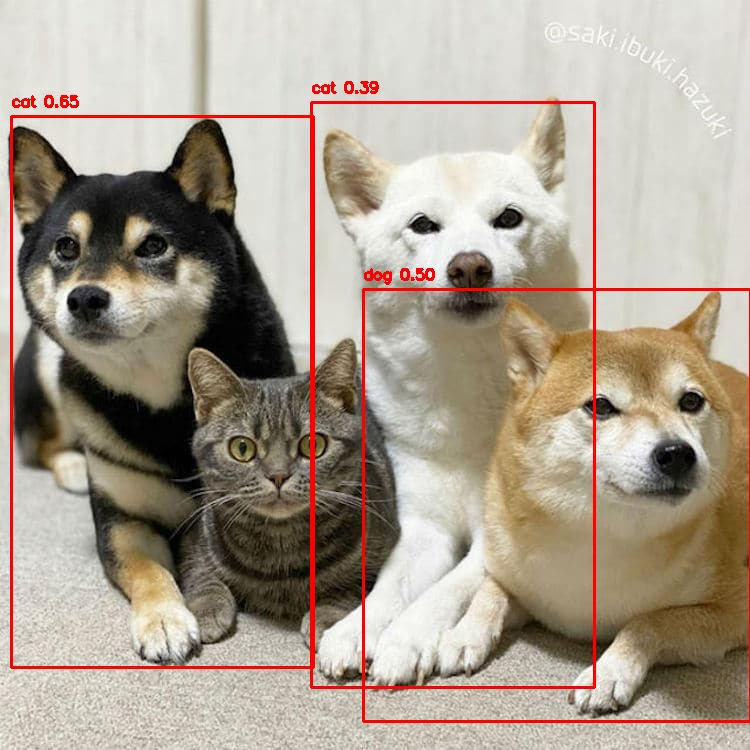

In [2]:
import cv2
import matplotlib.pyplot as plt
from PIL import Image

def plot_results(results, img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Get bounding boxes and labels
    bboxes = results.xyxy[0].cpu().numpy()
    
    for bbox in bboxes:
        # Extract bounding box coordinates and label
        x1, y1, x2, y2, conf, cls = bbox
        label = results.names[int(cls)]
        
        # Draw rectangle
        cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)
        # Put label
        cv2.putText(img, f'{label} {conf:.2f}', (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    return img

img1_cv = cv2.imread(img1)
img2_cv = cv2.imread(img2)

# Convert images to RGB format
img1_cv = cv2.cvtColor(img1_cv, cv2.COLOR_BGR2RGB)
img2_cv = cv2.cvtColor(img2_cv, cv2.COLOR_BGR2RGB)

# Convert images to PIL format
img1_pil = Image.fromarray(img1_cv)
img2_pil = Image.fromarray(img2_cv)

#Insert the inference code here.
with torch.no_grad():
    results1=model(img1_pil)
    results2=model(img2_pil)
        
# Draw bounding boxes on images
img1_with_bboxes = plot_results(results1, img1)
img2_with_bboxes = plot_results(results2, img2)
img1_save_path = 'imgs/img1_with_bboxes.jpg'
cv2.imwrite(img1_save_path, cv2.cvtColor(img1_with_bboxes, cv2.COLOR_RGB2BGR))
img2_save_path = 'imgs/img2_with_bboxes.jpg'
cv2.imwrite(img2_save_path, cv2.cvtColor(img2_with_bboxes, cv2.COLOR_RGB2BGR))

from IPython.display import Image, display
display(Image(filename=img1_save_path))
display(Image(filename=img2_save_path))



### Question 1

Analyze the inference results of the 2 images. 
1. How well did the model detect the objects in the pictures? with what confidance?
2. What can possibly be the reason for the model failures? suggest methods to resolve that issue.
3. recall that we learned how to fool a model by adverserial attack (PGD), describe how you would attack an Object Detection model (such as YOLO).

In [3]:
from cs236781.answers import display_answer
import hw2.answers


In [4]:
display_answer(hw2.answers.part6_q1)



1. Model Performance and Confidence:
IMPORTANT NOTE: In the following images, we chose images containing objects that can be detect by the model, meaning the model has a label class for this object.
By doing so, we make sure that the model fails due to the conditions of the image and not because lack of knowlage. 
image1:

The YOLOv5 model detected 3 bounding boxes in the image:

Bounding Box 1: Detected as a person with a confidence of 0.47 (actually a dolphin).
Bounding Box 2: Detected as a person with a confidence of 0.90 (actually 2 dolphins).
Bounding Box 3: Detected as a surfboard with a confidence of 0.67 (actually a tail of one of the dolphins).

image2:
The YOLOv5 model detected 3 bounding boxes in the image:

Bounding Box 1: Detected as a cat with a confidence of 0.65 (actually a dog and part of a cat).
Bounding Box 2: Detected as a cat with a confidence of 0.39 (actually a dog).
Bounding Box 3: Detected as a dog with a confidence of 0.50 (overlapping another dog).

2.Possible Reasons for Model Failures: 
    *Overlapping Objects and Similar Fur Colors:*
    When objects overlap significantly and have similar appearances or textures, the model might have difficulty distinguishing between them.
    *Silhouettes and Low Contrast:*
    Shadows and silhouettes lack distinct features, and low contrast between objects and background can make detection difficult.

Methods to Resolve These Issues:
    *Data Augmentation:* Use techniques such as contrast adjustment to expose the model to a wide range of lighting scenarios, including shadows and silhouettes. This helps the model learn to recognize objects based on shape and context rather than just texture and color.
    *Dataset Enhancement:* Include more images with overlapping objects and similar textures in the training dataset to better represent real-world scenarios. This improves the model's ability to distinguish between objects with similar appearances.
   
3.To carry out an adversarial attack on a YOLO object detection model, we would start by creating a clone of the input image and setting it to require gradients.
We would then iteratively update the adversarial image copy to maximize the loss (rather than minimize it) by taking gradient steps. The objective is to maximize the loss of the object detection model, causing it to misclassify objects, fail to detect objects, or create false positives.
 After each step, we would project the perturbations back to ensure they remain within a specified epsilon norm limit. The goal is to find a small perturbation on a certain input, in a way that is almost imperceptible to humans but causes the model to make incorrect predictions.
                    
                

## Creative Detection Failures

<a id=part6_2></a>

Object detection pitfalls could be, for example: **occlusion** - when the objects are partially occlude, and thus missing important features, **model bias** - when a model learn some bias about an object, it could recognize it as something else in a different setup, and many others like **Deformation**, **Illumination conditions**, **Cluttered** or **textured background and blurring** due to moving objects.

**TODO**: Take pictures and that demonstrates 3 of the above object detection pitfalls, run inference and analyze the results.

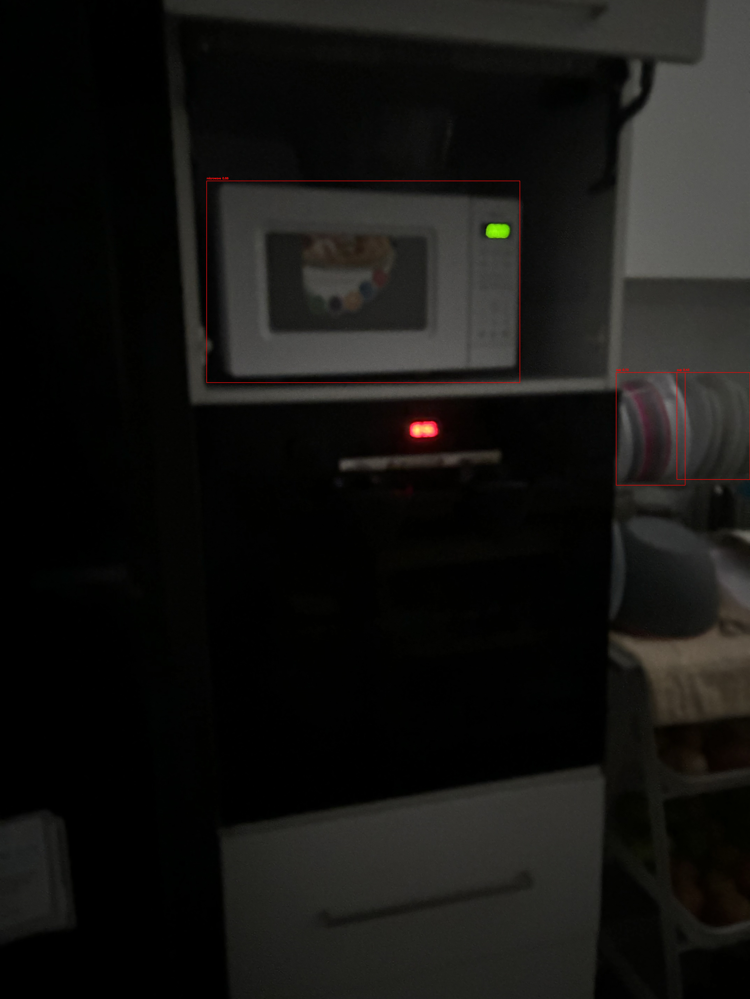

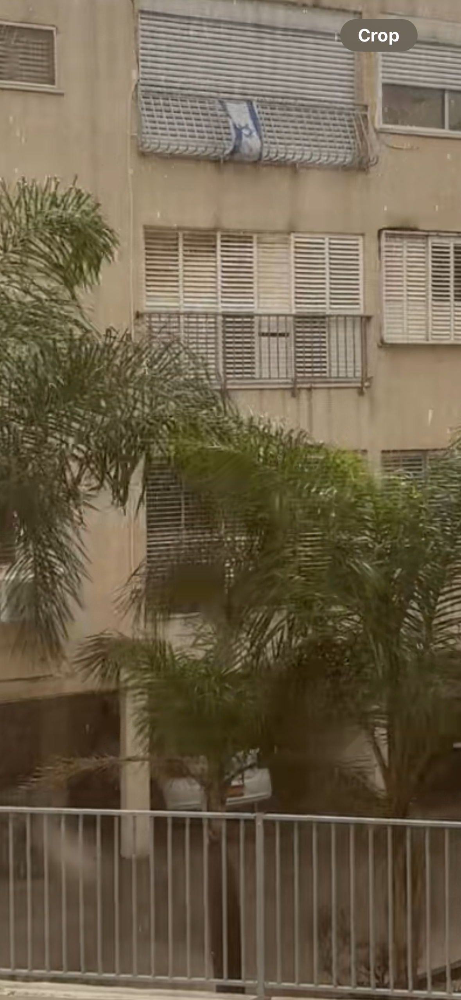

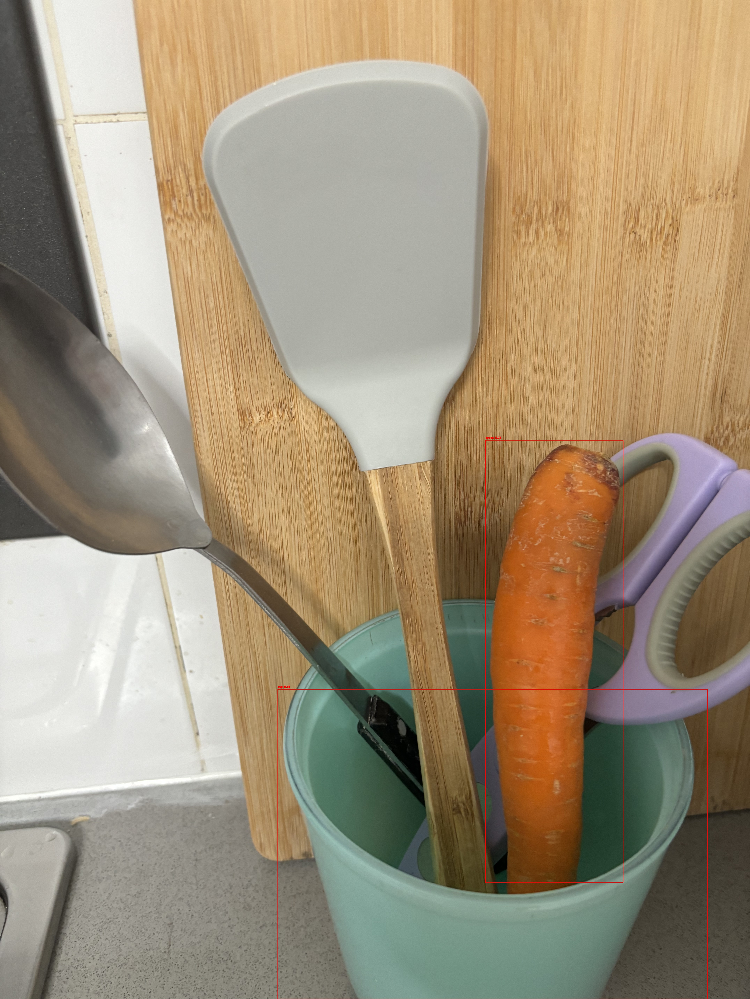

In [5]:
#Insert the inference code here.
img3= 'imgs/oven.png'
img4= 'imgs/hidden_car.PNG'
img5= 'imgs/out_of_contex_carrot.png'
with torch.no_grad():
    results3=model(img3)
    results4=model(img4)
    results5=model(img5)
        
# Draw bounding boxes on images
img3_with_bboxes = plot_results(results3, img3)
img4_with_bboxes = plot_results(results4, img4)
img5_with_bboxes = plot_results(results5, img5)

img3_save_path = 'imgs/img3_with_bboxes.jpg'
cv2.imwrite(img3_save_path, cv2.cvtColor(img3_with_bboxes, cv2.COLOR_RGB2BGR))
img4_save_path = 'imgs/img4_with_bboxes.jpg'
cv2.imwrite(img4_save_path, cv2.cvtColor(img4_with_bboxes, cv2.COLOR_RGB2BGR))
img5_save_path = 'imgs/img5_with_bboxes.jpg'
cv2.imwrite(img5_save_path, cv2.cvtColor(img5_with_bboxes, cv2.COLOR_RGB2BGR))
from IPython.display import Image, display
display(Image(filename=img3_save_path))
display(Image(filename=img4_save_path))
display(Image(filename=img5_save_path))

### Question 3

Analyize the results of the inference. 
1. How well did the model detect the objects in the pictures? explain.


In [6]:
display_answer(hw2.answers.part6_q3)



Model Performance and Confidence:

image3:

The YOLOv5 model detected 3 bounding boxes in the image:

Bounding Box 1: Detected as a microwave correctly but with a confidence of 0.66 .
Bounding Box 2: Detected a bowl as a cup with a confidence of 0.73. 
Bounding Box 3: Detected several plates as a cup with a confidence of 0.43.
The oven in the image was not detected!

important: the model does not have a 'bowl' or a 'plate' class. 

The model performed poorly in detecting the oven in the image due to lighting conditions and blur.

image4:
The YOLOv5 model did not detect the car in the image because it was partially occluded, thus missing important features.

image5:
The YOLOv5 model detected 3 bounding boxes in the image:

Bounding Box 1: Detected a carrot as a spoon but with a confidence of 0.25.
Bounding Box 2: Detected as a cup correctly with a confidence of 0.55.

The YOLOv5 model exhibited model bias by mistaking the carrot for a spoon due to the context. 
This might be because the model has learned to associate objects in specific setups, resulting in incorrect identification in this unusual arrangement.



## Bonus 
<a id=part6_3></a>

Try improving the model performance over poorly recognized images by changing them. 
Describe the manipulations you did to the pictures.

In [7]:
#insert bonus code here

In [8]:
display_answer(hw2.answers.part6_bonus)



**Your answer:**


Write your answer using **markdown** and $\LaTeX$:
```python
# A code block
a = 2
```
An equation: $e^{i\pi} -1 = 0$

